# Face projections

## Aligning

In [1]:
import os

%cd stylegan2-ada-pytorch

from stylegan2_models.image_aligner.face_alignment import image_align
from stylegan2_models.image_aligner.landmarks_detector import LandmarksDetector

%cd ..

landmarks_model_path = "./stylegan2-ada-pytorch/pretrained_models/shape_predictor_68_face_landmarks.dat"
RAW_IMAGES_DIR = "./celebs"
ALIGNED_IMAGES_DIR = "./aligned_images"

landmarks_detector = LandmarksDetector(landmarks_model_path)

def align_images(landmarks_detector, raw_images_dir, aligned_images_dir):
    for celeb in os.listdir(raw_images_dir):
      celeb_folder = raw_images_dir
      save_path = aligned_images_dir
      os.makedirs(save_path, exist_ok=True)
      for i, img_name in enumerate(os.listdir(celeb_folder)):
          if img_name == ".ipynb_checkpoints":
            continue
          raw_img_path = os.path.join(celeb_folder, img_name)
          for face_landmarks in landmarks_detector.get_landmarks(raw_img_path):
              aligned_face_path = os.path.join(save_path, f"{i}.jpg")
              image_align(raw_img_path, aligned_face_path, face_landmarks)
              break

align_images(landmarks_detector, RAW_IMAGES_DIR, ALIGNED_IMAGES_DIR)

/home/peter/anaconda3/envs/torch_env/lib/python3.11/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]
/home/peter/anaconda3/envs/torch_env/lib/python3.11/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


/home/peter/PycharmProjects/DeepGenModelsHWs/stylegan2-ada-pytorch
/home/peter/PycharmProjects/DeepGenModelsHWs


## Projecting

In [2]:
%cd stylegan2-ada-pytorch

import torch_utils
import dnnlib

%cd ..

import PIL
from PIL import Image
import os, sys
import numpy as np
import torch
import lpips
import torch.nn as nn
import torchvision.transforms as transforms
from pytorch_msssim import ms_ssim
from tqdm import tqdm
import torch.nn.functional as F
import pickle

import warnings
warnings.filterwarnings("ignore")

class HiddenPrints:
    def __enter__(self):
        self._original_stdout = sys.stdout
        sys.stdout = open(os.devnull, 'w')

    def __exit__(self, exc_type, exc_val, exc_tb):
        sys.stdout.close()
        sys.stdout = self._original_stdout
        

# https://pypi.org/project/pytorch-msssim/
class Rec_loss(nn.Module):
    def __init__(self):
        super().__init__()
        self.l1_criterion = torch.nn.L1Loss(reduction='mean')

    def forward(self, target, synth):
        target = torch.add(target, 1.0)
        target = torch.mul(target, 127.5)
        target = target / 255

        synth = torch.add(synth, 1.0)
        synth = torch.mul(synth, 127.5)
        synth = synth / 255

        loss = torch.mean(1 - ms_ssim(synth, target, data_range=1, size_average=True))
        return loss


# https://pypi.org/project/lpips/
class Lpips_loss(nn.Module):
    def __init__(self, device):
        super().__init__()
        self.lpips_loss = lpips.LPIPS(net='vgg')
        self.lpips_loss.to(device)
        self.lpips_loss.eval()

    def forward(self, target, synth):
        return torch.mean(self.lpips_loss(target, synth))


# https://github.com/NVlabs/stylegan2-ada-pytorch/blob/main/projector.py#L104
class Reg_loss(nn.Module):
    def __init__(self, noise_bufs):
        super().__init__()
        self.noise_bufs = noise_bufs

    def forward(self,):
        reg_loss = 0.0
        for v in self.noise_bufs.values():
            noise = v[None,None,:,:] # must be [1,1,H,W] for F.avg_pool2d()
            while True:
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=3)).mean()**2
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=2)).mean()**2
                if noise.shape[2] <= 8:
                    break
                noise = F.avg_pool2d(noise, kernel_size=2)
        return reg_loss

# image = (image - mean) / std
def image2tensor_norm(image):
    transform = transforms.Compose([transforms.ToTensor(),
                                   transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    tensor = transform(image)
    return tensor

def broadcast_w_sg(w_batch, cast_n=18):
    input_ws = []
    for w in w_batch:
        w_broadcast = torch.broadcast_to(w, (cast_n, 512))
        input_ws.append(w_broadcast)
    return torch.stack(input_ws)

device = 'cuda'

model_path = "./stylegan2-ada-pytorch/pretrained_models/ffhq.pkl"

with open(model_path, 'rb') as f:
    G = pickle.load(f)['G_ema'].to(device)

lpips_loss = Lpips_loss(device)
rec_loss = Rec_loss()
noise_bufs = {name: buf for (name, buf) in G.synthesis.named_buffers() if 'noise_const' in name }
reg_loss = Reg_loss(noise_bufs)

regularize_noise_weight = 5e5
rec_weight = 0.5
lpips_weight = 1

num_steps = 150
seed = 42
initial_learning_rate = 0.05
w_avg_samples = 10000

# 150 шагов, спускаться будем очень медленно
lr_decay = 0.995

def get_img_proj(fn):
    target_pil = Image.open(fn).convert('RGB')
    target_tensor = image2tensor_norm(target_pil).to(device).unsqueeze(0)

    z_samples = torch.from_numpy(np.random.RandomState(seed).randn(w_avg_samples, G.z_dim)).to(device)
    w_samples = G.mapping(z_samples, None)
    w_samples = w_samples[:, :1, :].cpu().numpy().astype(np.float32)
    w_avg = np.mean(w_samples, axis=0, keepdims=True)   # [1, 1, C]
    w_std = (np.sum((w_samples - w_avg) ** 2) / w_avg_samples) ** 0.5
    
    w_opt = torch.tensor(w_avg, dtype=torch.float32, device=device, requires_grad=False)
    w_opt = broadcast_w_sg(w_opt).requires_grad_(True)
    
    optimizer = torch.optim.Adam([w_opt], lr=initial_learning_rate)
    lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=lr_decay)
    generated_tensors = []
    for step in range(num_steps):
        synth_tensor = G.synthesis(broadcast_w_sg(w_opt), noise_mode='const')
        
        lpips_value = lpips_loss(synth_tensor, target_tensor)
        rec_value = rec_loss(synth_tensor, target_tensor)
        reg_value = reg_loss()
        
        loss = lpips_value*lpips_weight + rec_value*rec_weight + reg_value*regularize_noise_weight
        
        optimizer.step()
        optimizer.zero_grad(set_to_none=True)
        loss.backward()

        lr_scheduler.step()
        
        generated_tensors.append(synth_tensor)
        
    generated_tensor = G.synthesis(broadcast_w_sg(w_opt), noise_mode='const', force_fp32=True)

    img = generated_tensor[0].permute(1, 2, 0).detach().cpu().numpy()
    img = (img + 1) * 127.5

    return img.astype('uint8'), broadcast_w_sg(w_opt)

/home/peter/anaconda3/envs/torch_env/lib/python3.11/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


/home/peter/PycharmProjects/DeepGenModelsHWs/stylegan2-ada-pytorch
/home/peter/PycharmProjects/DeepGenModelsHWs
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/peter/anaconda3/envs/torch_env/lib/python3.11/site-packages/lpips/weights/v0.1/vgg.pth


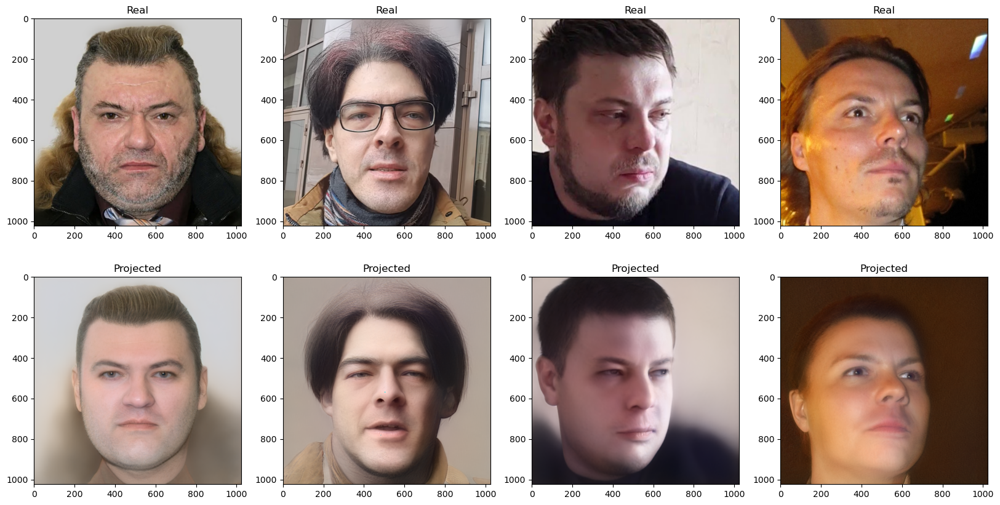

In [3]:
import matplotlib.pyplot as plt
import cv2

ALIGNED_IMAGES_DIR = "./aligned_images"
fns = [fn for fn in os.listdir(ALIGNED_IMAGES_DIR) if os.path.isfile(os.path.join(ALIGNED_IMAGES_DIR, fn))]
fns = sorted(fns, key=lambda x: int(x.split('.')[0]))

celebs = [cv2.imread(os.path.join(ALIGNED_IMAGES_DIR, fn)) for fn in fns]
celebs = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in celebs]

regenerated_projections = list()
projections = list()

# у меня какие-то проблемы с окружением, некоторые НЕОБЯЗАТЕЛЬНЫЕ плагины ninja не может поставить и валит сотни принтов, пришлось вот так поборосться с ними :(
with HiddenPrints():
    for fn in fns:
        regenerated_proj, proj = get_img_proj(os.path.join(ALIGNED_IMAGES_DIR, fn))
        regenerated_projections.append(regenerated_proj)
        projections.append(proj)

fig, axes = plt.subplots(ncols=4, nrows=2, figsize=(20, 10))

for i in range(4):
    axes[0, i].imshow(celebs[i])
    axes[0, i].set_title('Real')

    axes[1, i].imshow(regenerated_projections[i])
    axes[1, i].set_title('Projected')

Поигрался с разными lr scheduler'ами. Лучше всего показал экспоненциальный с большой gamma. Параметры трогать не стал, их подбор слишком долгий. 

Пришлось подбирать параметры lr scheduler'а: при слишком сильном снижении возникали артефакты. Я их связываю с слишком тонким приближением, которое приводило вектор проекции в "доселе невиданные" генератором места латентного пространства

# Style transfer

## Project styles to latent space and visualize regenerations

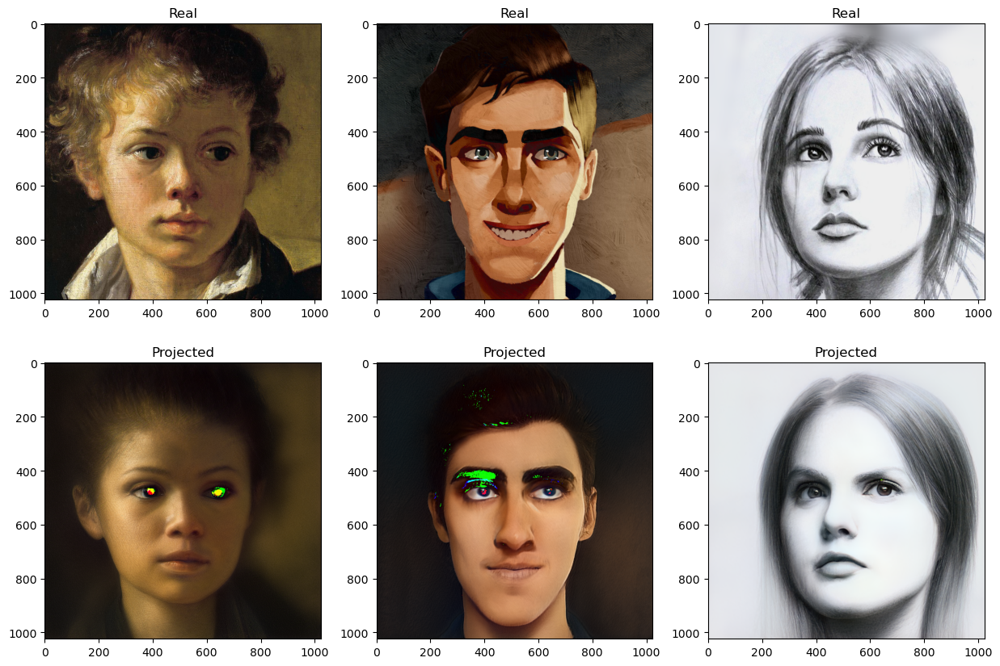

In [4]:
import matplotlib.pyplot as plt
import cv2

STYLED_IMAGES_DIR = './styled_images'
ALIGNED_STYLED_IMAGES_DIR = './aligned_styled_images'

align_images(landmarks_detector, STYLED_IMAGES_DIR, ALIGNED_STYLED_IMAGES_DIR)

fns = [fn for fn in os.listdir(ALIGNED_STYLED_IMAGES_DIR) if os.path.isfile(os.path.join(ALIGNED_STYLED_IMAGES_DIR, fn))]
styled_images = [cv2.imread(os.path.join(ALIGNED_STYLED_IMAGES_DIR, fn)) for fn in fns]
styled_images = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in styled_images]

styles_regenerated = list()
style_projections = list()

with HiddenPrints():
    for fn in fns:
        regenerated_proj, proj = get_img_proj(os.path.join(ALIGNED_STYLED_IMAGES_DIR, fn))
        styles_regenerated.append(regenerated_proj)
        style_projections.append(proj)

fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(15, 10))

for i in range(3):
    axes[0, i].imshow(styled_images[i])
    axes[0, i].set_title('Real')

    axes[1, i].imshow(styles_regenerated[i])
    axes[1, i].set_title('Projected')

С карандашным скетчем получилось совсем хорошо. Два других стиля похуже, даже артефакты есть(. Надеюсь, они не помешают

## Style transfer itself

Попробовал порисовать графики проекций и их характеристик, понять, какой график за что отвечает не получилось. В гугле прочитал, что первые 7 векторов отвечают за черты лица, а все остальные за стиль

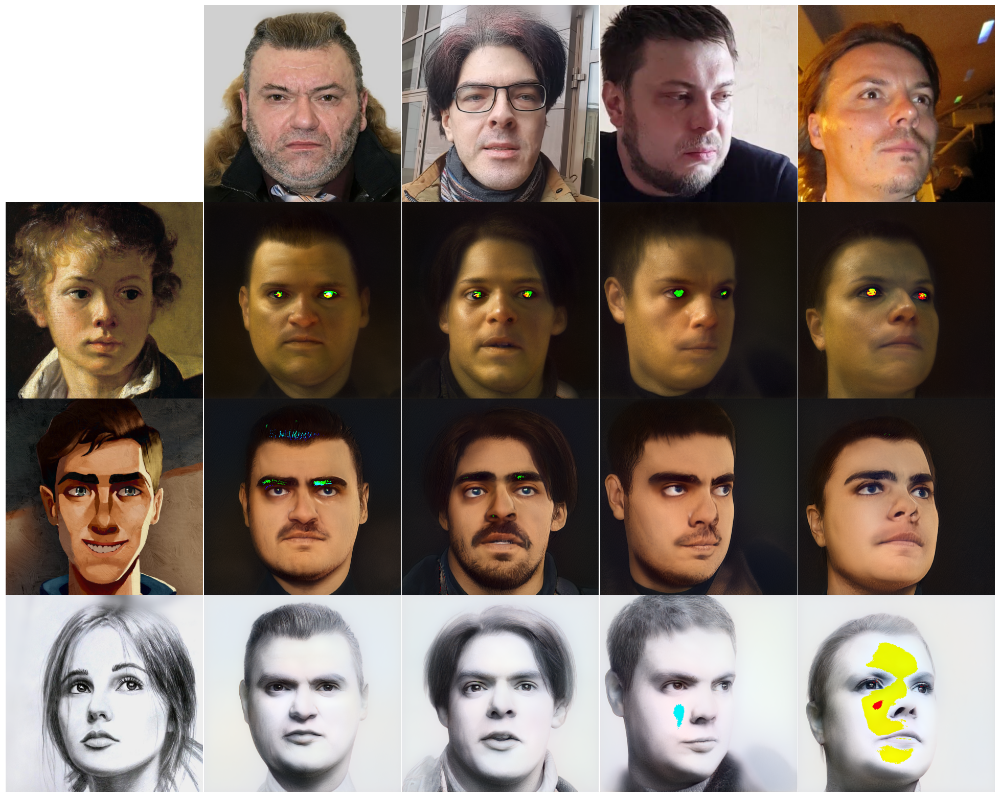

In [5]:
face_indices = torch.arange(7)
style_indices = torch.arange(7, 18)

mixed = list()

for celeb_proj in projections:
    for style_proj in style_projections:
        new_latent = torch.empty((1, 18, 512), dtype=torch.float32).to(device)
        new_latent[:, face_indices] = celeb_proj[:, face_indices]
        new_latent[:, style_indices] = style_proj[:, style_indices]

        # принты не отпускают(
        with HiddenPrints():
            synth = G.synthesis(new_latent, noise_mode='const', force_fp32=True)
        synth = synth[0].permute(1, 2, 0).detach().cpu().numpy()
        synth = (synth + 1) * 127.5

        mixed.append(synth.astype('uint8'))

fig, axes = plt.subplots(ncols=5, nrows=4, figsize=(25, 20), gridspec_kw = {'wspace':0, 'hspace':0})

for i, celeb in enumerate(celebs):
    axes[0, i+1].imshow(celeb)
    
for j, styled_image in enumerate(styled_images):
    axes[j+1, 0].imshow(styled_image)
    
for i, synth in enumerate(mixed):
    axes[i % 3 + 1, i // 3 + 1].imshow(synth)

for ax in axes.flatten():
    ax.axis('off')

Цветовую гамму удалось угадать вполне нелохо для всех стилей, но присутствуют артефакты. Плюс два стиля не совсем хорошо спроектировались еще в самом начале.

**Как выбирал вектора:** Попробовал найти какую-то закономерность, не получилось. В гугле прочитал, что первые семь векторов отвечают за черты лица, а остальные одиннадцать за стиль

# Expression transfer

## Project original and expression images

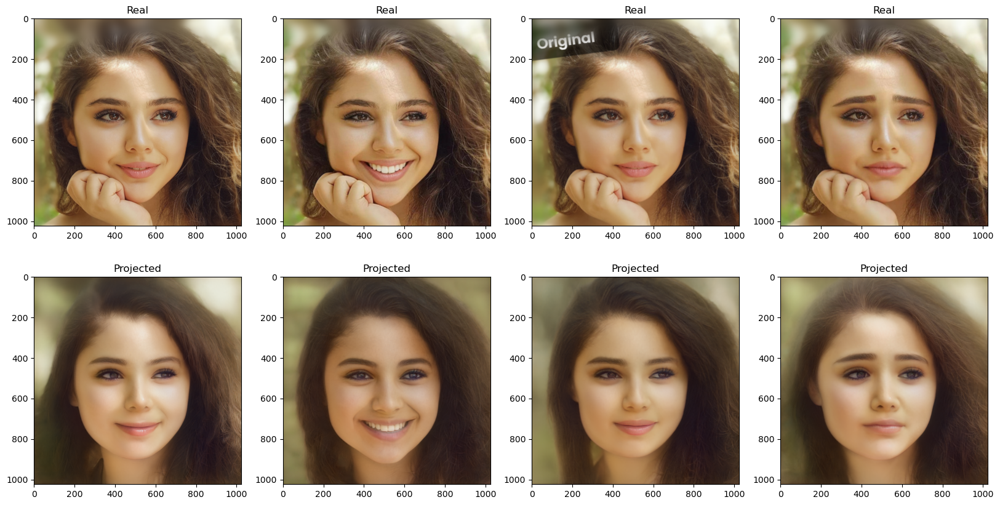

In [6]:
import matplotlib.pyplot as plt
import cv2

EXP_IMAGES_DIR = './expressions'
ALIGNED_EXP_IMAGES_DIR = './aligned_expressions'

align_images(landmarks_detector, EXP_IMAGES_DIR, ALIGNED_EXP_IMAGES_DIR)

fns = [fn for fn in os.listdir(ALIGNED_EXP_IMAGES_DIR) if os.path.isfile(os.path.join(ALIGNED_EXP_IMAGES_DIR, fn))]
exp_images = [cv2.imread(os.path.join(ALIGNED_EXP_IMAGES_DIR, fn)) for fn in fns]
exp_images = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in exp_images]

exps_regenerated = list()
exp_projections = list()

with HiddenPrints():
    for fn in fns:
        regenerated_proj, proj = get_img_proj(os.path.join(ALIGNED_EXP_IMAGES_DIR, fn))
        exps_regenerated.append(regenerated_proj)
        exp_projections.append(proj)

fig, axes = plt.subplots(ncols=4, nrows=2, figsize=(20, 10))

for i in range(4):
    axes[0, i].imshow(exp_images[i])
    axes[0, i].set_title('Real')

    axes[1, i].imshow(exps_regenerated[i])
    axes[1, i].set_title('Projected')

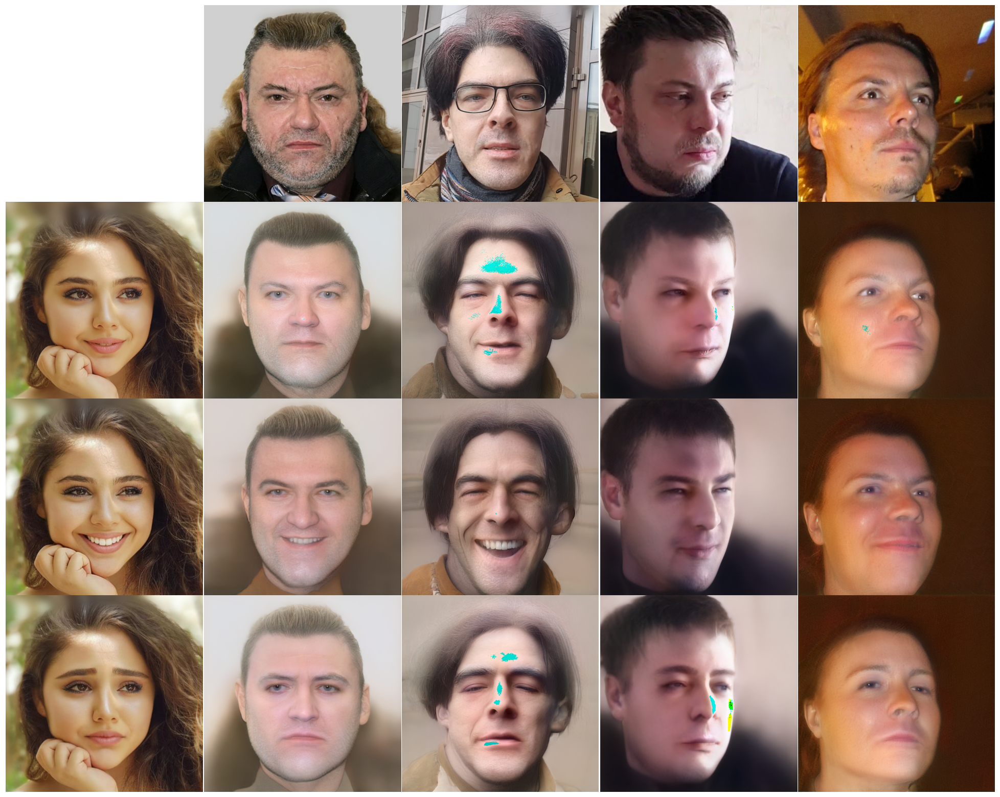

In [7]:
original_idx = 2
sad_idx = 3
smiling0_idx = 0
smiling1_idx = 1

transfer_expression_parameter = 0.85 # подбирал руками
w2 = exp_projections[original_idx]

transfered_emotions = list()

for w1 in projections:
    for exp_proj_idx in [smiling0_idx, smiling1_idx, sad_idx]:
        w3 = exp_projections[exp_proj_idx]
        new_latent = w1 + transfer_expression_parameter * (w3 - w2)
        
        # принты не отпускают(
        with HiddenPrints():
            synth = G.synthesis(new_latent, noise_mode='const', force_fp32=True)
        synth = synth[0].permute(1, 2, 0).detach().cpu().numpy()
        synth = (synth + 1) * 127.5

        transfered_emotions.append(synth.astype('uint8'))

fig, axes = plt.subplots(ncols=5, nrows=4, figsize=(25, 20), gridspec_kw = {'wspace':0, 'hspace':0})

for i, celeb in enumerate(celebs):
    axes[0, i+1].imshow(celeb)
    
for j, exp_image_idx in enumerate([smiling0_idx, smiling1_idx, sad_idx]):
    axes[j+1, 0].imshow(exp_images[exp_image_idx])
    
for i, synth in enumerate(transfered_emotions):
    axes[i % 3 + 1, i // 3 + 1].imshow(synth)

for ax in axes.flatten():
    ax.axis('off')

Ярковыраженные эмоции (грусть и улыбка #1) передались вполне неплохо. Более нейтральная улыбка передалась не так хорошо

# Face swap

In [29]:
%cd stylegan2-ada-pytorch

from stylegan2_models.arcface_model import get_model

%cd ..

class Arcface_Loss(nn.Module):
    def __init__(self, weights_path, device):
        super().__init__()

        self.arcnet = get_model("r50", fp16=False)
        self.arcnet.load_state_dict(torch.load(weights_path))
        self.arcnet.eval()
        self.arcnet.to(device)

        self.cosin_loss = nn.CosineSimilarity(dim=1, eps=1e-6)

    def forward(self, source, synth):

        source = F.interpolate(source,size=(112,112), mode='bicubic')
        synth = F.interpolate(synth,size=(112,112), mode='bicubic')

        emb1 = self.arcnet(source)
        emb2 = self.arcnet(synth)
        loss = (1 - self.cosin_loss(emb1, emb2))[0]
        return loss


arcface_loss = Arcface_Loss('./ms1mv3_arcface_r50_fp16.pth', device)

regularize_noise_weight = 5e5
rec_weight = 0.5
lpips_weight = 1
arcface_weight = 0.2

num_steps = 300
seed = 42
initial_learning_rate = 0.01
w_avg_samples = 10000

# 300 шагов, спускаться будем очень медленно
lr_decay = 0.995


def transfer_face(source, target):
    source_pil = Image.open(source).convert('RGB')
    source_tensor = image2tensor_norm(source_pil).to(device).unsqueeze(0)

    target_pil = Image.open(target).convert('RGB')
    target_tensor = image2tensor_norm(target_pil).to(device).unsqueeze(0)

    z_samples = torch.from_numpy(np.random.RandomState(seed).randn(w_avg_samples, G.z_dim)).to(device)
    w_samples = G.mapping(z_samples, None)
    w_samples = w_samples[:, :1, :].cpu().numpy().astype(np.float32)
    w_avg = np.mean(w_samples, axis=0, keepdims=True)   # [1, 1, C]
    w_std = (np.sum((w_samples - w_avg) ** 2) / w_avg_samples) ** 0.5
    
    w_opt = torch.tensor(w_avg, dtype=torch.float32, device=device, requires_grad=False)
    w_opt = broadcast_w_sg(w_opt).requires_grad_(True)
    
    optimizer = torch.optim.Adam([w_opt], lr=initial_learning_rate)
    lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=lr_decay)
    generated_tensors = []
    for step in range(num_steps):
        synth_tensor = G.synthesis(broadcast_w_sg(w_opt), noise_mode='const')
        
        lpips_value = lpips_loss(synth_tensor, target_tensor)
        rec_value = rec_loss(synth_tensor, target_tensor)
        reg_value = reg_loss()
        arcface_value = arcface_loss(source_tensor, synth_tensor)
        
        loss = lpips_value*lpips_weight + rec_value*rec_weight + reg_value*regularize_noise_weight + arcface_value*arcface_weight
        
        optimizer.step()
        optimizer.zero_grad(set_to_none=True)
        loss.backward()

        lr_scheduler.step()
        
        generated_tensors.append(synth_tensor)
        
    generated_tensor = G.synthesis(broadcast_w_sg(w_opt), noise_mode='const', force_fp32=True)

    img = generated_tensor[0].permute(1, 2, 0).detach().cpu().numpy()
    img = (img + 1) * 127.5

    return img.astype('uint8')

/home/peter/PycharmProjects/DeepGenModelsHWs/stylegan2-ada-pytorch
/home/peter/PycharmProjects/DeepGenModelsHWs


In [30]:
import matplotlib.pyplot as plt
import cv2

ALIGNED_IMAGES_DIR = "./aligned_images"
fns = [fn for fn in os.listdir(ALIGNED_IMAGES_DIR) if os.path.isfile(os.path.join(ALIGNED_IMAGES_DIR, fn))]
fns = sorted(fns, key=lambda x: int(x.split('.')[0]))

celebs = [cv2.imread(os.path.join(ALIGNED_IMAGES_DIR, fn)) for fn in fns]
celebs = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in celebs]

swapped_faces = list()

# у меня какие-то проблемы с окружением, некоторые НЕОБЯЗАТЕЛЬНЫЕ плагины ninja не может поставить и валит сотни принтов, пришлось вот так поборосться с ними :(
with HiddenPrints():
    for i, ifn in enumerate(fns):
        for j, jfn in enumerate(fns):
            if i == j:
                swapped_faces.append(None)
                continue
            swapped_faces.append(transfer_face(os.path.join(ALIGNED_IMAGES_DIR, ifn), os.path.join(ALIGNED_IMAGES_DIR, jfn)))

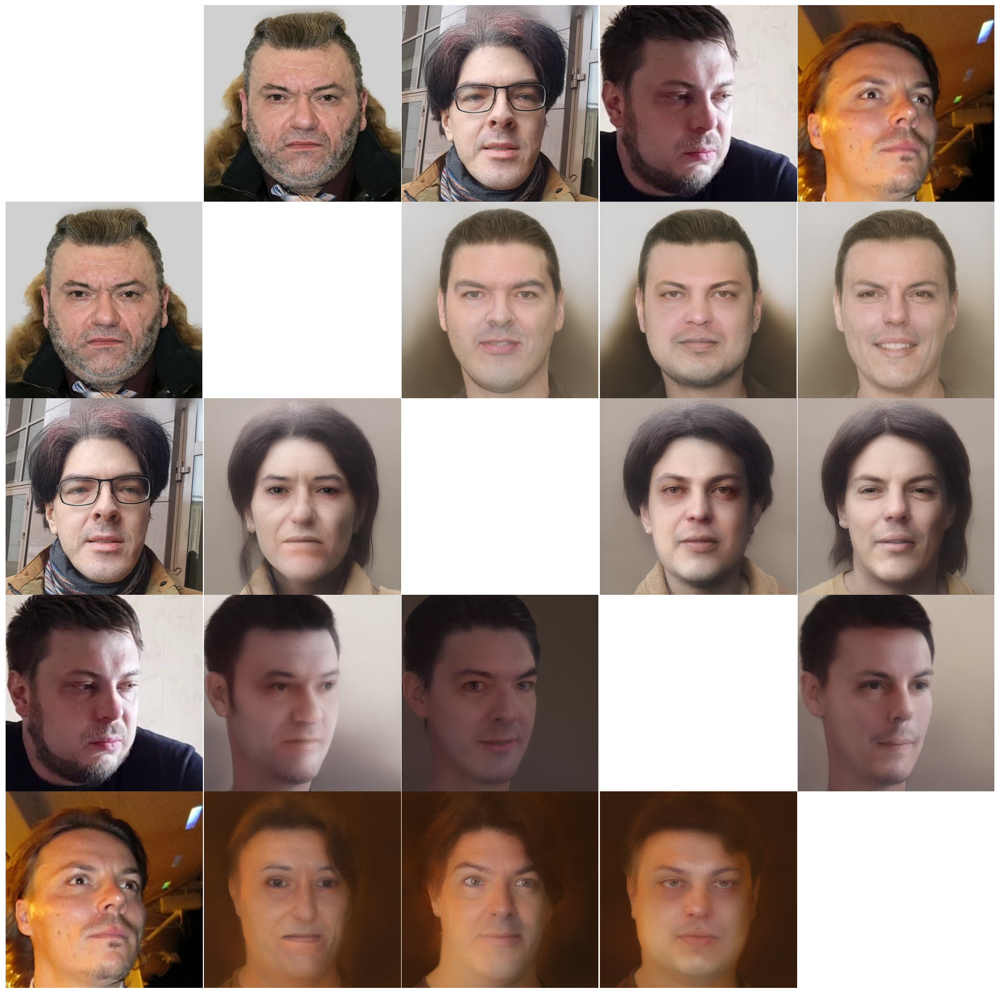

In [31]:
fig, axes = plt.subplots(ncols=5, nrows=5, figsize=(25, 25), gridspec_kw = {'wspace':0, 'hspace':0})

for i, celeb in enumerate(celebs):
    axes[0, i+1].imshow(celeb)
    
for j, celeb in enumerate(celebs):
    axes[j+1, 0].imshow(celeb)
    
for i, synth in enumerate(swapped_faces):
    if synth is None:
        continue
    axes[i % 4 + 1, i // 4 + 1].imshow(synth)

for ax in axes.flatten():
    ax.axis('off')

Получилось очень неплохо: наклоны головы сохранились, лица (в большинстве) пересадились хорошо. Чтобы этого добиться я:

1. Подобрал вес для ArcFaceLoss
2. Понизил стартовый lr
3. Увеличил количество шагов